In [1]:
import os
import time

import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

import config
from classifier.classifier import Net
from utils import rotation_correction, read_ground_truth

RED = (0, 0, 255)
GREEN = (0, 255, 0)
BLUE = (255, 0, 0)

CYAN = (255, 255, 0)
MAGENTA = (255, 0, 255)

gt_annoatations = read_ground_truth(config.sudokus_gt_path)
source_root = 'D:/dev/sudoku'

classifier = Net(input_size=64)
classifier.load()

raw_sudoku


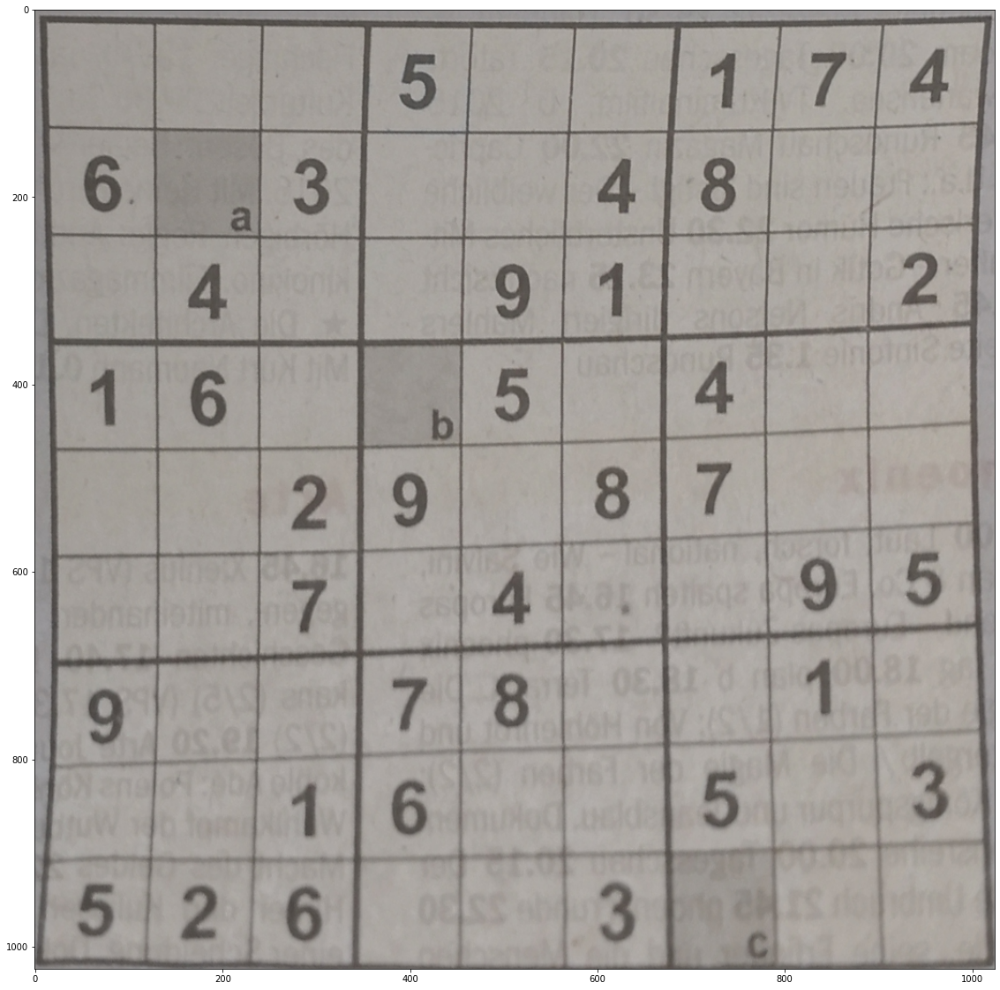

Found  901  squares.


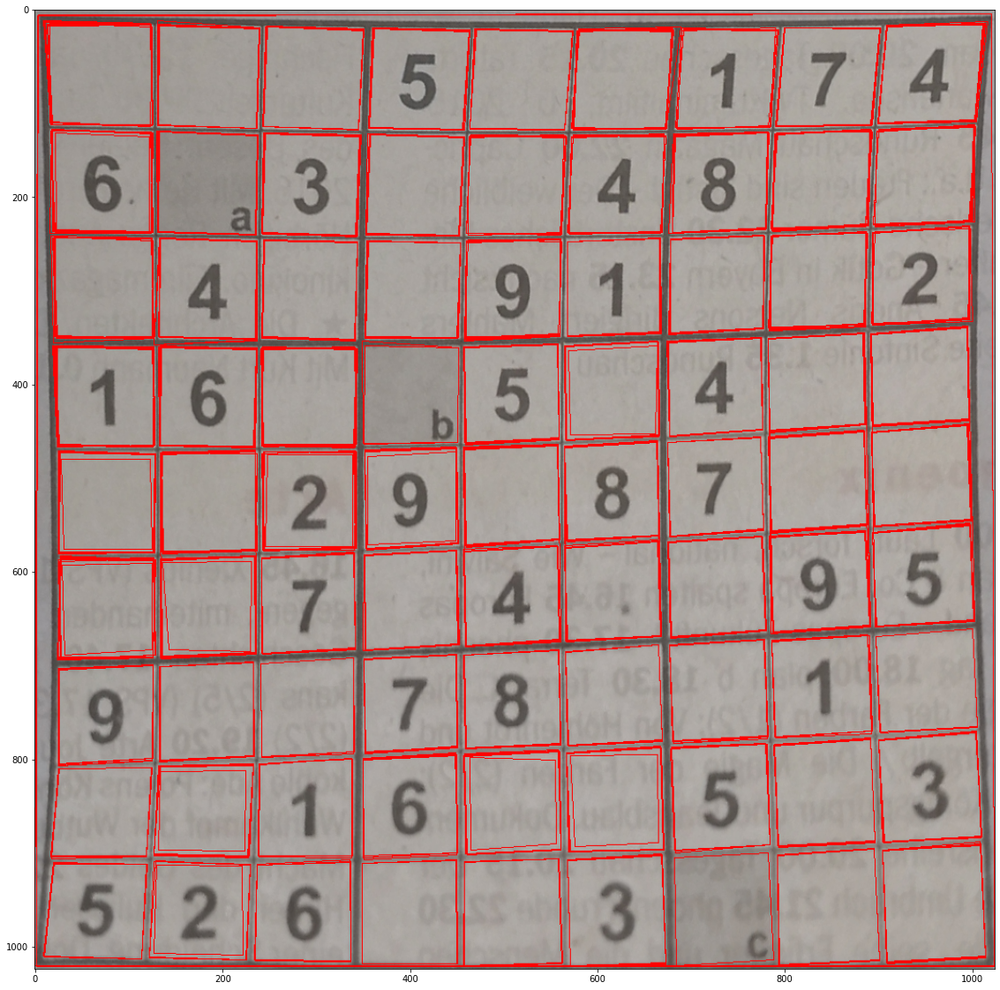

Found  88  squares.


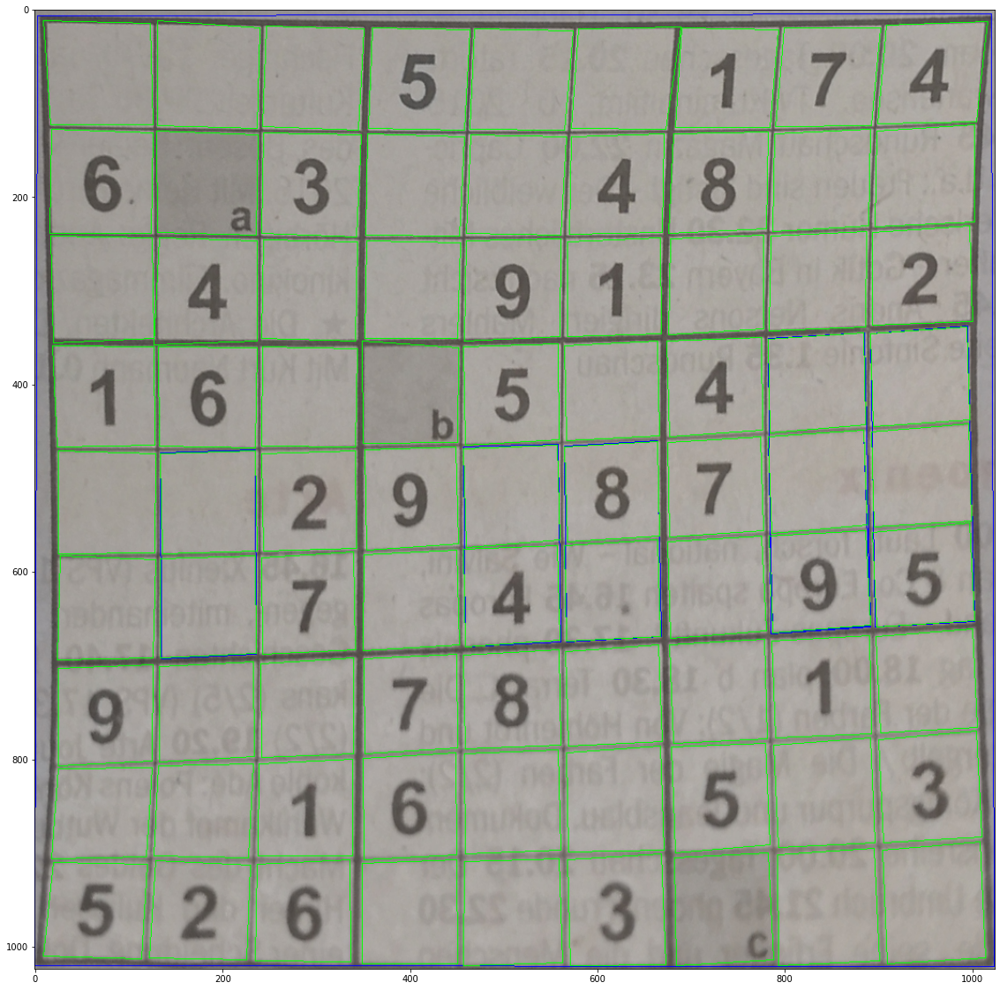

[   9588.     9898.     9951.     9955.     9963.5   10009.    10016.
   10061.    10095.    10099.    10101.    10114.    10170.    10203.
   10203.5   10212.5   10218.    10250.    10251.    10257.    10312.
   10315.    10318.    10322.5   10330.    10340.5   10352.5   10397.
   10399.5   10408.5   10436.    10525.5   10546.    10555.    10588.5
   10605.    10611.    10622.    10652.    10659.5   10668.5   10682.5
   10699.    10702.5   10703.    10706.5   10710.    10718.    10727.
   10747.    10747.    10809.    10813.    10815.    10867.5   10972.
   10980.    11019.    11023.5   11031.    11064.5   11080.5   11090.
   11134.5   11178.5   11257.5   11281.5   11290.5   11414.    11450.5
   11493.    11679.5   11693.    11701.    11776.    11779.5   11822.
   11882.5   12201.    12575.5   12842.5   20918.    21528.    21569.
   22123.    32894.5   33012.  1034790. ]


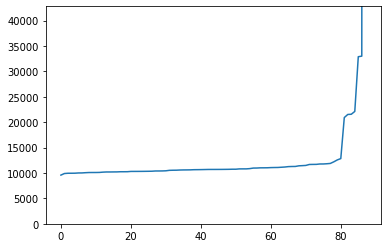

Cellmapping


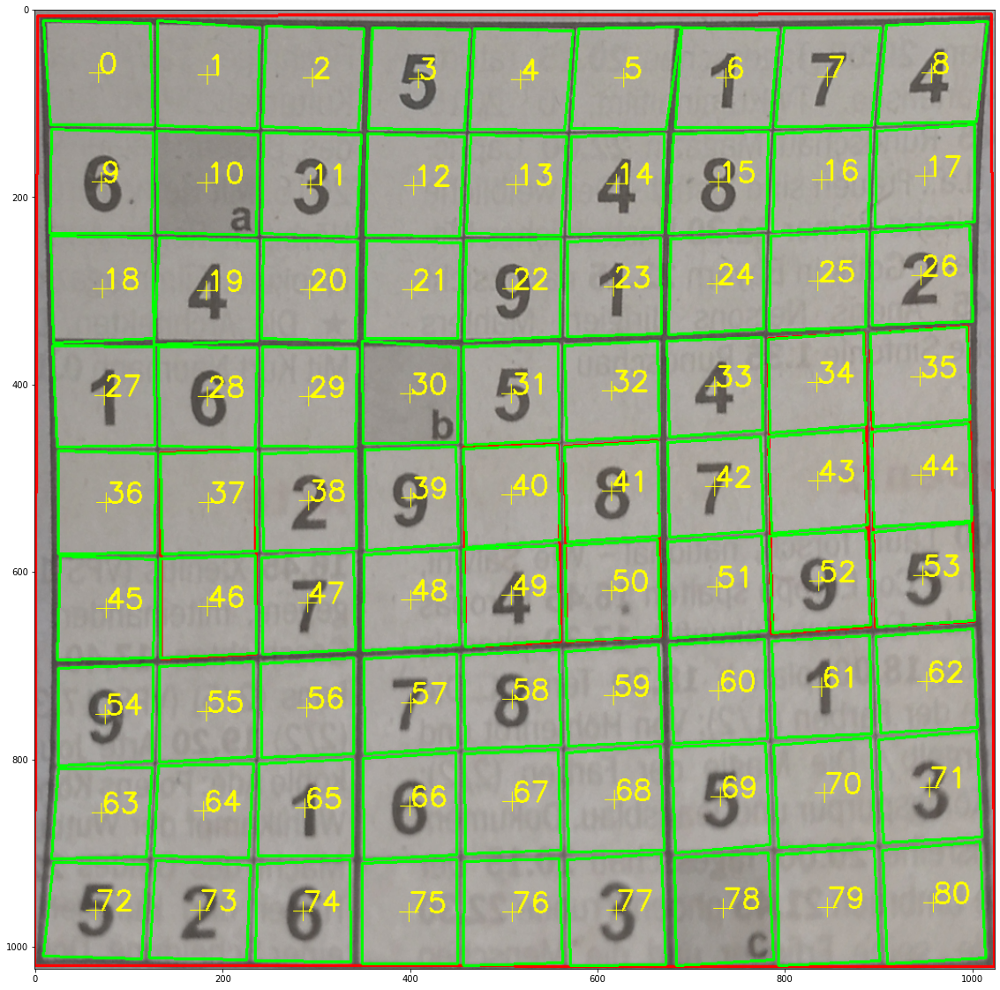

D:\dev\sudoku\venv\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Took  4.719616889953613


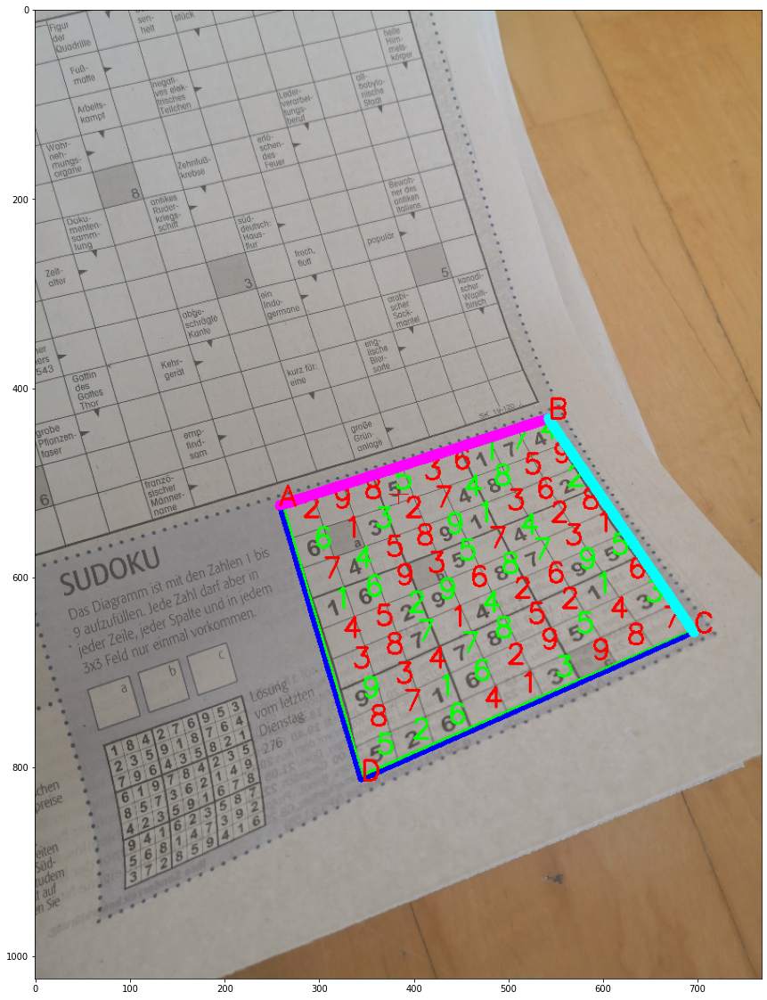

In [2]:
from utils import normalize_rect_orientation
from solver.sudoku_solver import solve_sudoku
from detection_utils import detect_sudoku, in_resize, pad_contour, unwarp_patch, binarize_sudoku
from detection_utils import compute_cell2node_mapping_fast, approx_quad


def show(img, title=None):
    if title is not None:
        print(title)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.show()


def extract_cells(image):
    sudoku = binarize_sudoku(image)

    contours, hierarchy = cv.findContours(sudoku, cv.RETR_CCOMP, cv.CHAIN_APPROX_SIMPLE)

    def has_cell_size(box):
        area = cv.contourArea(box)
        return 80 * 80 <= area <= 120 * 120

    boxes = list(map(approx_quad, contours))
    cells = [(box.mean(axis=0), box) for box in filter(lambda box: has_cell_size(box), boxes)]

    cell_to_node = compute_cell2node_mapping_fast(cells)

    # contour_canvas = image.copy()
    # for box in boxes:
    #     color = (0, 255, 0) if has_cell_size(box) else (0, 0, 255)
    #     cv.polylines(contour_canvas, [box], isClosed=True, color=color, thickness=2)
    #
    # for i in range(81):
    #     cell_idx = cell_to_node.flatten()[i]
    #     if cell_idx < 0:
    #         continue
    #     cx, cy = cells[cell_idx][0]
    #     center = (int(cx), int(cy))
    #     cv.putText(contour_canvas, str(i), center, cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), thickness=2)
    #     cv.drawMarker(contour_canvas, center, (0, 255, 255))
    #
    # show(contour_canvas, 'Cellmapping')

    pad = 3
    patch_size = 64
    padded_size = (patch_size + 2 * pad, patch_size + 2 * pad)

    cell_coords = np.zeros((81, 4, 2))
    cell_patches = np.zeros((81, patch_size, patch_size, 3), dtype=np.uint8)
    for i in range(81):
        node_idx = cell_to_node.flatten()[i]
        if node_idx < 0:
            cell_coords[i, :, :] = -1
            continue

        coordinates = cells[node_idx][1]

        padded_cell_patch = unwarp_patch(image, coordinates, out_size=padded_size)

        cell_coords[i, :, :] = coordinates
        cell_patches[i, :, :, :] = padded_cell_patch[pad:pad + patch_size, pad:pad + patch_size]

    return cell_patches, cell_coords


def extract_cells_v2(image):
    def iou(c1, c2):
        # Assumes that the contours are both convex!!!
        inter, _ = cv.intersectConvexConvex(c1, c2, handleNested=True)
        return inter / (cv.contourArea(c1, False) + cv.contourArea(c2, False) - inter)

    def square_nms(squares, thresh=0.7):
        areas = np.array([cv.contourArea(c, False) for c in squares])
        indices = np.argsort(areas)[::-1]
        sorted_squares = [squares[idx] for idx in indices]

        output = []
        for sq in sorted_squares:
            keep = True
            for kept_sq in output:
                if iou(sq, kept_sq) >= thresh:
                    keep = False
                    break

            if keep:
                output.append(sq)

        return output

    def angle_cos(p0, p1, p2):
        d1, d2 = (p0 - p1).astype('float'), (p2 - p1).astype('float')
        return abs(np.dot(d1, d2) / np.sqrt(np.dot(d1, d1) * np.dot(d2, d2)))

    def find_squares(img):
        img = cv.GaussianBlur(img, (5, 5), 0)

        kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, ksize=(5, 5))

        squares = []
        for gray in cv.split(img):
            for thresh in range(0, 40, 2):
                if thresh == 0:
                    bin = cv.Canny(gray, 0, 50, apertureSize=5)
                    bin = cv.dilate(bin, None)
                else:
                    # _, bin = cv.threshold(gray, thrs, 255, cv.THRESH_BINARY)
                    bin = cv.adaptiveThreshold(image_gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 31,
                                               thresh)
                    bin = cv.dilate(bin, kernel)
                    bin = cv.medianBlur(bin, 3)

                contours, _ = cv.findContours(bin, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
                for cnt in contours:
                    cnt_len = cv.arcLength(cnt, True)
                    cnt = cv.approxPolyDP(cnt, 0.02 * cnt_len, True)
                    if len(cnt) == 4 and cv.contourArea(cnt) > 1000 and cv.isContourConvex(cnt):
                        cnt = cnt.reshape(-1, 2)
                        # squares.append(cnt)
                        max_cos = np.max([angle_cos(cnt[i], cnt[(i + 1) % 4], cnt[(i + 2) % 4]) for i in range(4)])
                        if max_cos < 0.2:
                            squares.append(cnt)
        return squares

    show(image, 'raw_sudoku')
    image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

    # edges = cv.Canny(image, 50, 200, None, 3)
    # show(edges, 'edges')

    # h = np.histogram(image_gray, bins=256)
    # plt.bar(np.arange(256), h)
    # plt.show()

    # values, counts = np.unique(image_gray, return_counts=True)
    # plt.bar(values, counts)
    # plt.show()

    squares = find_squares(image_gray)
    squares_nms = square_nms(squares, 0.7)

    sqCanvas = image.copy()
    for square in squares:
        cv.polylines(sqCanvas, [square], True, RED, thickness=1)
    print('Found ', len(squares), ' squares.')
    show(sqCanvas)

    sq2Canvas = image.copy()
    for square in squares_nms:
        area = cv.contourArea(square, False)
        col = RED if area < 6000 else (BLUE if area > 13000 else GREEN)

        cv.polylines(sq2Canvas, [square], True, col, thickness=1)
    print('Found ', len(squares_nms), ' squares.')
    show(sq2Canvas)

    sizes = np.sort(np.array([cv.contourArea(c, False) for c in squares_nms]))
    print(sizes)
    plt.plot(sizes)
    plt.ylim(0, 4 * np.median(sizes))
    plt.show()

    def has_cell_size(box):
        area = cv.contourArea(box)
        return 80 * 80 <= area <= 120 * 120

    # sudoku = binarize_sudoku(image)
    # show(sudoku, 'binarized')
    # contours, hierarchy = cv.findContours(sudoku, cv.RETR_CCOMP, cv.CHAIN_APPROX_SIMPLE)
    # boxes = list(map(approx_quad, contours))
    boxes = [normalize_rect_orientation(sq) for sq in squares_nms]

    cells = [(box.mean(axis=0), box) for box in filter(lambda box: has_cell_size(box), boxes)]

    cell_to_node = compute_cell2node_mapping_fast(cells)

    contour_canvas = image.copy()
    for box in boxes:
        color = (0, 255, 0) if has_cell_size(box) else (0, 0, 255)
        cv.polylines(contour_canvas, [box], isClosed=True, color=color, thickness=2)

    for i in range(81):
        cell_idx = cell_to_node.flatten()[i]
        if cell_idx < 0:
            continue
        cx, cy = cells[cell_idx][0]
        center = (int(cx), int(cy))
        cv.putText(contour_canvas, str(i), center, cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), thickness=2)
        cv.drawMarker(contour_canvas, center, (0, 255, 255))

    show(contour_canvas, 'Cellmapping')

    pad = 3
    patch_size = 64
    padded_size = (patch_size + 2 * pad, patch_size + 2 * pad)

    cell_coords = np.zeros((81, 4, 2))
    cell_patches = np.zeros((81, patch_size, patch_size, 3), dtype=np.uint8)
    for i in range(81):
        node_idx = cell_to_node.flatten()[i]
        if node_idx < 0:
            cell_coords[i, :, :] = -1
            continue

        coordinates = cells[node_idx][1]

        padded_cell_patch = unwarp_patch(image, coordinates, out_size=padded_size)

        cell_coords[i, :, :] = coordinates
        cell_patches[i, :, :, :] = padded_cell_patch[pad:pad + patch_size, pad:pad + patch_size]

    return cell_patches, cell_coords


file_path, gt_coords = gt_annoatations[11]
file_path = os.path.join(source_root, file_path)

sudoku_img_org = cv.imread(file_path)
start = time.time()

sudoku_img_org, gt_coords = rotation_correction(sudoku_img_org, gt_coords)

# Scaling such that the longer side is 1024 px long
input_downscale, sudoku_img = in_resize(sudoku_img_org)

sudoku_location = detect_sudoku(sudoku_img)
if sudoku_location is None:
    print('Failed to detect sudoku!')
    exit()

# Add padding to compensate for bounding boxes that fit too tight
padded_location = pad_contour(sudoku_location, padding=0)

# Unwarp from original image for best warp quality
scaled_locations = padded_location / input_downscale
unwarp_sudoku, unwarp_grid = unwarp_patch(sudoku_img_org, scaled_locations, return_grid=True)
unwarp_grid *= input_downscale

# Locate and extract the sudoku cells
# cell_images, cell_coords = extract_cells(unwarp_sudoku)
cell_images, cell_coords = extract_cells_v2(unwarp_sudoku)

# Classify the cells
out = np.zeros((81,), dtype=np.int32)
for i in range(81):
    cell_patch = cell_images[i, :, :, :]

    gray_cell = cv.cvtColor(cell_patch, cv.COLOR_BGR2GRAY)

    # pad = 6
    # _, pt = cv.threshold(gray_cell[pad:-pad, pad:-pad], 100, 255, cv.THRESH_BINARY_INV)
    # cell_filled = np.count_nonzero(pt) > 100 and np.var(gray_cell) > 500
    # out[i] = self.classifier.classify(gray_cell) if cell_filled else 0
    out[i] = classifier.classify(gray_cell)

occupied_cells = out != 0
cell_values = out.reshape((9, 9))

# Attempt to solve the sudoku
solved_sudoku = solve_sudoku(cell_values.tolist())

if solved_sudoku is None:
    print('Failed to solve the sudoku')
    solved_sudoku = None
else:
    solved_sudoku = np.array(solved_sudoku)

########################################################################################################################


# Visualization canvas
canvas = sudoku_img.copy()
image_center = (int(round(canvas.shape[1] / 2)), int(round(canvas.shape[0] / 2)))

# Draw gt rect
gt_coords = np.array(gt_coords).reshape(4, 2)
gt_coords = (gt_coords * input_downscale).astype(np.int32)
cv.polylines(canvas, [gt_coords], True, GREEN, thickness=3)

# draw image center
cv.drawMarker(canvas, image_center, RED)

if sudoku_location is None:
    print(f'Failed to detect sudoku.')

    cv.putText(canvas, 'Detection failed!', image_center, cv.FONT_HERSHEY_SIMPLEX, 2, RED, thickness=3)
else:
    bounds = sudoku_location

    solved_sudoku = cell_values if solved_sudoku is None else solved_sudoku

    # Cell values
    solved_sudoku = solved_sudoku.flatten()
    for i in range(81):
        cell_center = cell_coords[i, :, :].mean(0).astype(np.int32)
        cell_center = unwarp_grid[0, cell_center[1].item(), cell_center[0].item(), :].astype(np.int32)
        cell_center = (cell_center[0].item(), cell_center[1].item())

        color = GREEN if occupied_cells[i] else RED
        cv.putText(canvas, str(solved_sudoku[i]), cell_center, cv.FONT_HERSHEY_SIMPLEX, 1, color, thickness=2)

    # Sudoku detection bounds
    cv.polylines(canvas, [bounds], True, BLUE, thickness=3)
    cv.line(canvas, tuple(bounds[0, :]), tuple(bounds[1, :]), MAGENTA, thickness=10)
    cv.line(canvas, tuple(bounds[1, :]), tuple(bounds[2, :]), CYAN, thickness=10)

    # Sudoku corner labels
    for i in range(4):
        cv.putText(canvas, 'ABCD'[i], tuple(bounds[i, :]), cv.FONT_HERSHEY_SIMPLEX, 1, RED, thickness=2)

print('Took ', time.time() - start)
show(canvas)

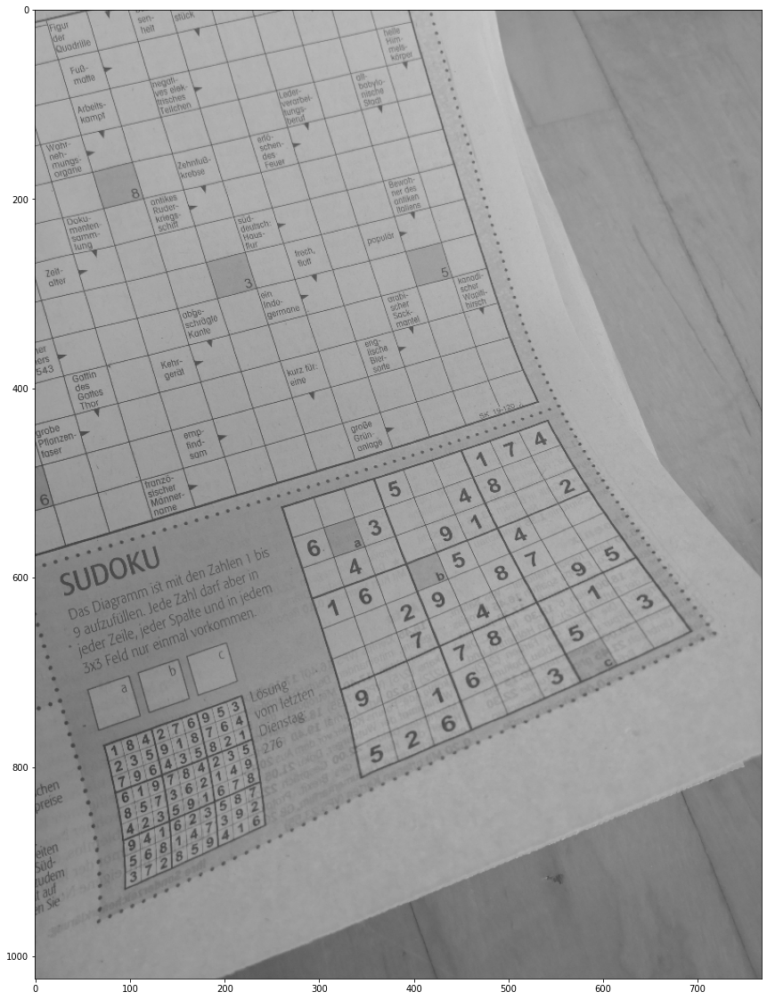

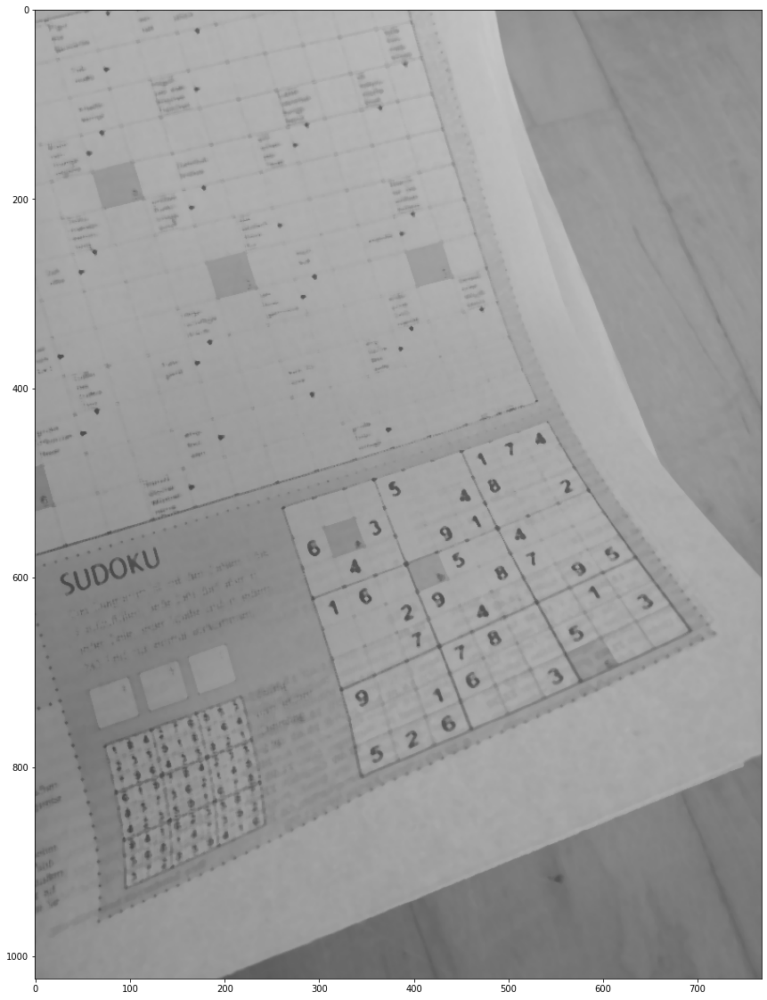

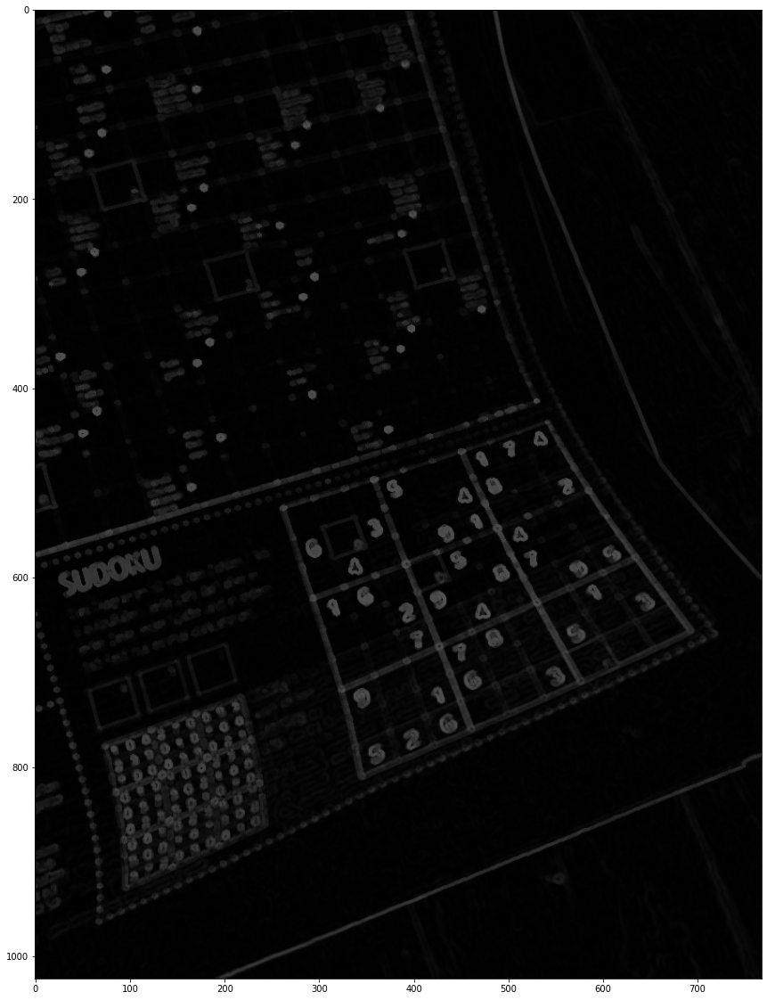

In [3]:
img = cv.cvtColor(sudoku_img, cv.COLOR_BGR2GRAY)

med = cv.medianBlur(img, 5)

kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5,5))
ero = cv.erode(med, kernel)
dil = cv.dilate(med, kernel)

show(img)
show(med)
# show(ero)
# show(dil)
# show(ero - dil)
show(dil - ero)

# thresholds = [1, 5,10,20]
# kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, ksize=(5, 5))
# for thresh in thresholds:
#     bin = cv.adaptiveThreshold(image_gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 51, thresh)
#     bin = cv.dilate(bin, kernel)
#     bin = cv.medianBlur(bin, 3)
#
#     show(bin)
#
#     contours, hierarchy = cv.findContours(bin, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
#
#     contourCanvas = image.copy()
#     for contour in contours:
#         contour = contour[:,0,:]
#         contour = cv.convexHull(contour)
#         cv.polylines(contourCanvas, [contour], True, RED, thickness=1)
#     show(contourCanvas)
#
# linebase = edges
# linebase = bin
#
# lineCanvas = image.copy()
# lines = cv.HoughLines(linebase, 1, np.pi / 180, 150, None, 0, 0)
#
# if lines is not None:
#     for i in range(0, len(lines)):
#         rho = lines[i][0][0]
#         theta = lines[i][0][1]
#         a = math.cos(theta)
#         b = math.sin(theta)
#         x0 = a * rho
#         y0 = b * rho
#         pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
#         pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
#         cv.line(lineCanvas, pt1, pt2, (0,0,255), 3, cv.LINE_AA)
#
# show(lineCanvas)
#
#
# linePCanvas = image.copy()
# linesP = cv.HoughLinesP(linebase, 1, np.pi / 180, 50, None, 1024/10, 10)
# if linesP is not None:
#     for i in range(0, len(linesP)):
#         l = linesP[i][0]
#         cv.line(linePCanvas, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv.LINE_AA)
#
#     print(len(linesP))
#
# show(linePCanvas)

# lines = cv.HoughLines(image, 1, np.pi / 180, int(1024 / 3))
# print(lines.shape)